
Ball 1: μ=-0.02210741378680768, σ=0.7927671243499578, RMSE=0.7930753124353591

Ball 2: μ=-0.18117043959912077, σ=0.7418217215629217, RMSE=0.7636243806788228

Ball 3: μ=-0.15709284522758588, σ=0.8357689189951694, RMSE=0.8504045202020343


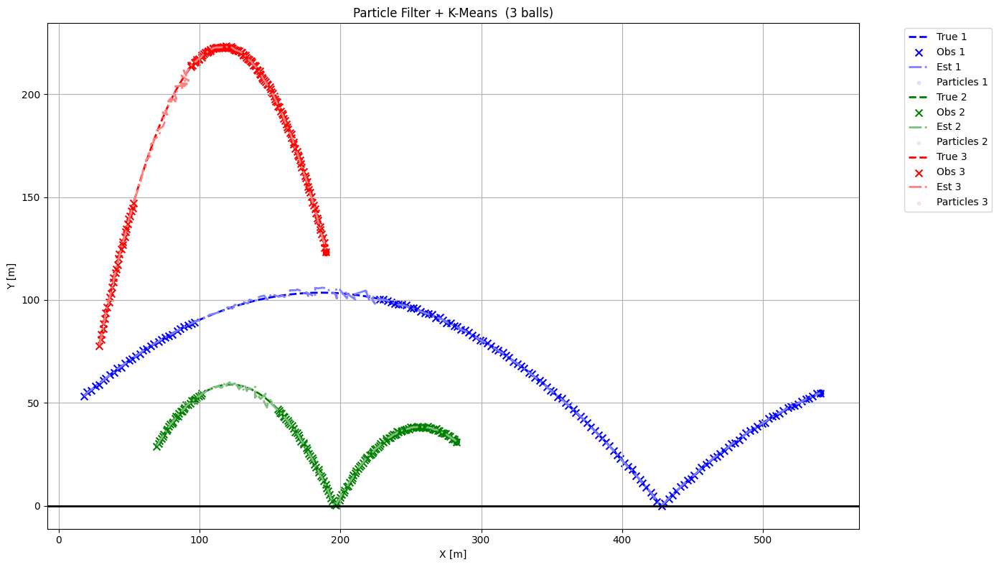

In [1]:
# ==========================================================
import random                         # std‐lib RNG (angles, speeds, etc.)
import numpy as np                    # vector maths
import matplotlib.pyplot as plt       # plotting
import matplotlib.colors as mcolors   # tweak colour brightness
from IPython.display import HTML      # (unused here; could embed anim.)
from sklearn.cluster import KMeans    # unsupervised clustering
from itertools import permutations    # all n! permutations for ≤4 balls
from scipy.optimize import linear_sum_assignment  # Hungarian algorithm
from matplotlib.animation import FuncAnimation    # optional animation

# ------------------------- CONSTANTS -------------------------
num_particles = 100_000   # N in PF: more ⇒ smoother posteriors
num_clusters  = 2         # sub-clusters *inside* one ball’s cloud  , have two strong possibilities about the position of a ball.
# We use K-Means to find these clusters and select the most dominant one.

# np.random.seed(42)      # reproducible if you uncomment both
# random.seed(42)

DT         = 0.05         # Δt  [s]
TOTAL_TIME = 10           # sim duration
TIME_STEPS = int(TOTAL_TIME / DT)
G          = 9.81         # g  [m s⁻²]
ELASTICITY = 0.8          # e  (v_after = −e·v_before)
GROUND_LEVEL = 0.0        # y = 0 is “floor”

# --- Process & measurement noise (uniform ± range) ------------
PROC_NOISE_POS = 0.5      # process σ_pos  ≈ ±0.5 m
PROC_NOISE_VEL = 0.5      # process σ_vel  ≈ ±0.5 m s⁻¹
MEAS_NOISE_POS = 0.5      # sensor   σ_pos  ≈ ±0.5 m

NUM_BALLS          = 3    # how many separate projectiles
PARTICLES_PER_BALL = 4    # state dims = (x, y, vx, vy)

# ------------------ COLOUR-HELPER FUNCTION -------------------
#If lighten = True, it brings the color closer to white. The higher the amount value, the whiter it becomes.
def adjust_colour(col, amount=0.5, lighten=True):
    """Return lighter/darker shade. amount=1 ⇒ white/black."""
    rgb = np.array(mcolors.to_rgb(col))
    return tuple(1 - (1 - rgb) * (1 - amount)) if lighten else tuple(rgb * (1 - amount))

BASE_COLOURS = ['b','g','r','c','m','y','k'][:NUM_BALLS]
TRUE_COLOURS = BASE_COLOURS                         # ground truth
EST_COLOURS  = [adjust_colour(c, 0.5) for c in BASE_COLOURS]  # estimates

# --------------- PRE-ALLOCATE LARGE ARRAYS -------------------
particles            = np.zeros((num_particles, NUM_BALLS*PARTICLES_PER_BALL))  # (N, 4B)
weights              = np.ones(num_particles) / num_particles                   # uniform

true_positions       = np.zeros((TIME_STEPS, NUM_BALLS, 2))  # x*,y*     
#   [[[1.0, 3.0], [2.0, 5.0]],   # t = 0 → ball1: (1,3), ball2: (2,5)
#   [[1.2, 2.8], [2.2, 4.8]],   # t = 1


true_velocities      = np.zeros((TIME_STEPS, NUM_BALLS, 2))  # vx*,vy*

observed_positions   = np.zeros((TIME_STEPS, NUM_BALLS, 2))  # z = x*+η

estimated_positions  = np.zeros((TIME_STEPS, NUM_BALLS, 2))  # PF+KMeans
estimated_velocities = np.zeros((TIME_STEPS, NUM_BALLS, 2))

cluster_centers_history = [[None]*NUM_BALLS for _ in range(TIME_STEPS)]
cluster_weights_history = [[None]*NUM_BALLS for _ in range(TIME_STEPS)]
particle_history        = []  # for plotting later

# ------------- RANDOM INITIAL (Speed, Angle, Pos) ------------
def initialise_ball_params(n):
    params = []
    for _ in range(n):
        launch_pos   = [random.uniform(10,85), random.uniform(12,92)]   # x0,y0 [m]
        launch_speed = random.uniform(20,80)                            # v0   [m/s]
        launch_angle = np.radians(random.uniform(20,80))                # θ0   [rad]
        params.append({'position':launch_pos,'speed':launch_speed,'angle':launch_angle})
    return params

ball_params = initialise_ball_params(NUM_BALLS)

# ------------- TRUE STATE + INITIAL PARTICLE CLOUD -----------
for i,p in enumerate(ball_params):
    # --- true starting state (one per ball) ---
    true_positions[0,i]  = p['position']
    true_velocities[0,i] = [p['speed']*np.cos(p['angle']),   # vx0 = v0 cosθ
                            p['speed']*np.sin(p['angle'])]   # vy0 = v0 sinθ

    # --- spread N particles around that truth ----------------
    x,y,vx,vy = i*4, i*4+1, i*4+2, i*4+3                     # column indices
    particles[:, x]  = p['position'][0] + np.random.uniform(-PROC_NOISE_POS, PROC_NOISE_POS, num_particles)
    particles[:, y]  = p['position'][1] + np.random.uniform(-PROC_NOISE_POS, PROC_NOISE_POS, num_particles)
    particles[:, vx] = true_velocities[0,i,0] + np.random.uniform(-PROC_NOISE_VEL, PROC_NOISE_VEL, num_particles)
    particles[:, vy] = true_velocities[0,i,1] + np.random.uniform(-PROC_NOISE_VEL, PROC_NOISE_VEL, num_particles)

# -------------- GROUND-TRUTH TRAJECTORY (Euler) --------------
for t in range(1, TIME_STEPS):
    for i in range(NUM_BALLS):
        # x_t = x_{t-1} + vx·Δt                          (move sideways)
        true_positions[t,i,0] = true_positions[t-1,i,0] + true_velocities[t-1,i,0]*DT
        # y_t = y_{t-1} + vy·Δt − ½gΔt²                  (arc downward)
        true_positions[t,i,1] = true_positions[t-1,i,1] + true_velocities[t-1,i,1]*DT - 0.5*G*DT**2

        true_velocities[t,i,0] = true_velocities[t-1,i,0]                   # vx constant
        true_velocities[t,i,1] = true_velocities[t-1,i,1] - G*DT            # vy ← vy−gΔt (gravity pulls)

        # bounce: if y < 0 ⇒ y=0, vy = −e·vy           (hit floor, flip up)
        if true_positions[t,i,1] < GROUND_LEVEL:
            true_positions[t,i,1]  = GROUND_LEVEL
            true_velocities[t,i,1] = -true_velocities[t,i,1]*ELASTICITY

# --------------- SYNTHETIC MEASUREMENTS (noise + gaps) -------
for t in range(TIME_STEPS):
    for i in range(NUM_BALLS):
        if 30 < t < 80:                             # sensor blackout window
            observed_positions[t,i] = [np.nan,np.nan]
        else:
            # z = x* + η  (true + noisy wiggle)
            observed_positions[t,i] = true_positions[t,i] + np.random.uniform(-MEAS_NOISE_POS, MEAS_NOISE_POS,2)

# --------------------- PARTICLE FILTER -----------------------
def predict(p):                                    # p ≡ particles_arr
    """Propagate every particle one step forward with noise."""
    for i in range(NUM_BALLS):
        x,y,vx,vy = i*4, i*4+1, i*4+2, i*4+3
        # x ← x + vxΔt + η_pos      (drift + jitter)
        p[:,x] += p[:,vx]*DT + np.random.uniform(-PROC_NOISE_POS, PROC_NOISE_POS, num_particles)
        # y ← y + vyΔt − ½gΔt² + η  (arc + jitter)
        p[:,y] += p[:,vy]*DT - 0.5*G*DT**2 + np.random.uniform(-PROC_NOISE_POS, PROC_NOISE_POS, num_particles)
        # vx ← vx + η_vel           (tiny random push)
        p[:,vx] += np.random.uniform(-PROC_NOISE_VEL, PROC_NOISE_VEL, num_particles)
        # vy ← vy − gΔt + η_vel     (gravity + noise)
        p[:,vy] += -G*DT + np.random.uniform(-PROC_NOISE_VEL, PROC_NOISE_VEL, num_particles)

        # ground bounce for particles too (mirror up)
        hit = p[:,y] < GROUND_LEVEL
        p[hit,y]  = GROUND_LEVEL
        p[hit,vy] = -p[hit,vy]*ELASTICITY

def update(p,w,Z,sigma):

    if np.isnan(Z).all():      # full dropout ⇒ skip correction
        return w

    N,nB   = p.shape[0], NUM_BALLS
    Pxy    = p.reshape(N,nB,4)[:,:,:2]             # extract (x,y) only

    if nB <= 4:
        L = np.zeros(N)
        for perm in permutations(range(nB)):       # all n! assignments
            d2 = ((Pxy - Z[list(perm)])**2).sum(axis=(1,2))   # Σ dist²
            L += np.exp(-0.5*d2/sigma**2)          # Gaussian bump (bell curve)
    else:
        L = np.zeros(N)
        for j in range(N):
            diff = Pxy[j][:,None,:] - Z[None,:,:]
            cost = np.linalg.norm(diff,axis=2)     # distance matrix
            row,col = linear_sum_assignment(cost)  # best pairing
            d2 = (cost[row,col]**2).sum()
            L[j] = np.exp(-0.5*d2/sigma**2)        # same bell curve

    w *= L                 # re-weight (combine old & new)
    w += 1e-300            # avoid zeros
    w /= w.sum()           # normalise (make probs)
    return w

def resample(p,w):         # draw with replacement by prob.
    idx = np.random.choice(np.arange(num_particles), size=num_particles, p=w)
    return p[idx].copy(), np.full_like(w, 1/num_particles)

# --------------------- MAIN PF+KMEANS LOOP -------------------
for t in range(TIME_STEPS):

    if t > 0: predict(particles)                   # step 1: motion (forecast)

    Z_t = observed_positions[t]                    # current meas.
    full_dropout = np.isnan(Z_t).all()

    if not full_dropout:                           # step 2: update
        weights   = update(particles, weights, Z_t, MEAS_NOISE_POS)
        particles,weights = resample(particles,weights)  # step 3: resample
        particle_history.append(particles.copy())
    else:
        particle_history.append(None)              # store placeholder

    # ---------- state estimation -----------------------------
    if full_dropout:                               # no Z ⇒ clustering only
        for i in range(NUM_BALLS):
            slice = particles[:,i*4:i*4+4]         # this ball’s particles
            km    = KMeans(n_clusters=num_clusters).fit(slice)
            #  Returns the index of the cluster with the most particles.
            dom   = np.argmax(np.bincount(km.labels_))   # densest mode
            mask  = km.labels_ == dom
            estimated_positions[t,i]  = slice[mask,:2].mean(axis=0)
            estimated_velocities[t,i] = slice[mask,2: ].mean(axis=0)
    else:                                          # have measurements
        all_xy = np.concatenate([particles[:,i*4:i*4+2] for i in range(NUM_BALLS)],axis=0)
        km     = KMeans(n_clusters=NUM_BALLS).fit(all_xy)
        C,labels = km.cluster_centers_, km.labels_

        for i in range(NUM_BALLS):
            idx   = np.argmin(np.linalg.norm(C - Z_t[i],axis=1))  # nearest centroid (match)
            estimated_positions[t,i] = C[idx]
            start,stop = i*num_particles,(i+1)*num_particles
            mask_rows  = labels[start:stop] == idx
            estimated_velocities[t,i] = [particles[mask_rows,i*4+2].mean(),  # avg vx
                                         particles[mask_rows,i*4+3].mean()]  # avg vy

# ---------------- STATS: Mean-Error, σ, RMSE -----------------
for i in range(NUM_BALLS):
    diff  = estimated_positions[:,i] - true_positions[:,i]   # error vector
    mean  = diff.mean()                                     # bias (average miss)
    sd    = diff.std()                                      # spread (σ)
    rmse  = np.sqrt((diff**2).mean())                       # √mean(e²)
    print(f"\nBall {i+1}: μ={mean}, σ={sd}, RMSE={rmse}")

# ------------------------- PLOTTING --------------------------
plt.figure(figsize=(14,8))
particle_idx = np.random.choice(num_particles,1000,replace=False)

for i in range(NUM_BALLS):
    plt.plot(true_positions[:,i,0], true_positions[:,i,1],'--',lw=2,
             color=TRUE_COLOURS[i],label=f'True {i+1}')
    mask_obs = ~np.isnan(observed_positions[:,i,0])
    plt.scatter(observed_positions[mask_obs,i,0],observed_positions[mask_obs,i,1],
                marker='x',s=50,color=BASE_COLOURS[i],label=f'Obs {i+1}')
    plt.plot(estimated_positions[:,i,0],estimated_positions[:,i,1],'-.',lw=2,
             color=EST_COLOURS[i],label=f'Est {i+1}')

    # draw last particle cloud for flavour
    last_valid = next((p for p in reversed(particle_history) if p is not None), None)
    if last_valid is not None:
        last = last_valid[particle_idx]
        plt.scatter(last[:,i*4],last[:,i*4+1],s=10,alpha=0.1,
                    color=BASE_COLOURS[i],label=f'Particles {i+1}')

plt.axhline(GROUND_LEVEL,color='k',lw=2)
plt.xlabel('X [m]'); plt.ylabel('Y [m]')
plt.title(f'Particle Filter + K-Means  ({NUM_BALLS} balls)')
plt.grid(True); plt.legend(bbox_to_anchor=(1.05,1),loc='upper left'); plt.tight_layout()
plt.show()


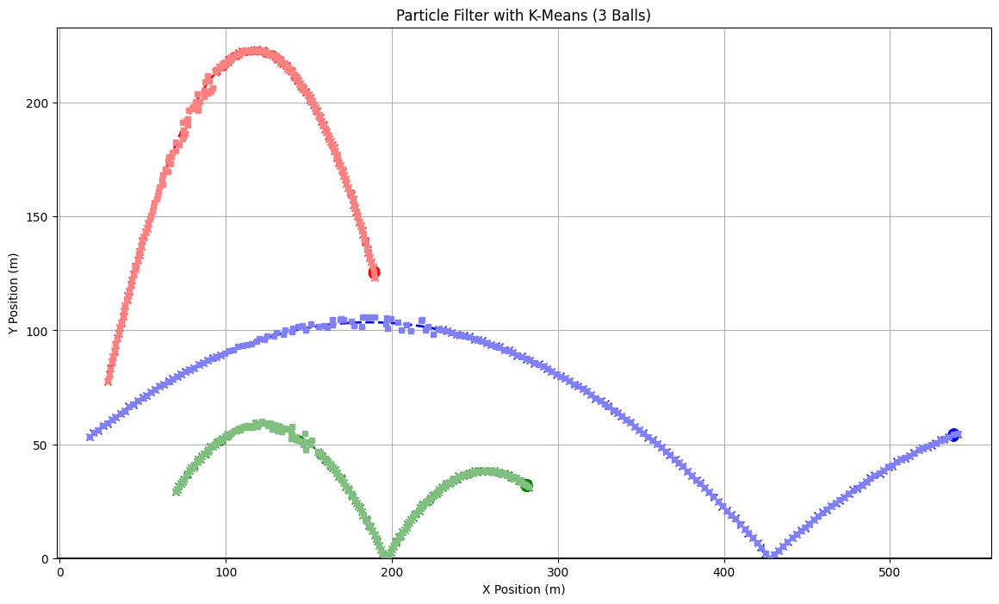

In [2]:
# -----------------------
# ANIMATION SETTINGS
# -----------------------
fig_anim, ax_anim = plt.subplots(figsize=(14, 8))

# Let the x-axis include any negative motion
x_min = np.min(true_positions[:, :, 0]) - 20   # margin on the left
x_max = np.max(true_positions[:, :, 0]) + 20   # margin on the right
ax_anim.set_xlim(x_min, x_max)

ax_anim.set_ylim(0, np.max(true_positions[:, :, 1]) + 10)
ax_anim.set_xlabel('X Position (m)')
ax_anim.set_ylabel('Y Position (m)')
ax_anim.set_title(f'Particle Filter with K-Means ({NUM_BALLS} Balls)')
ax_anim.axhline(y=GROUND_LEVEL, color='k', linewidth=2)  # ground line
ax_anim.grid(True)

# Marker definitions
true_dots = [ax_anim.plot([], [], '--', color=TRUE_COLOURS[i], linewidth=2)[0]
             for i in range(NUM_BALLS)]
obs_dots  = [ax_anim.plot([], [], 'x', color=BASE_COLOURS[i], markersize=6)[0]
             for i in range(NUM_BALLS)]
est_dots  = [ax_anim.plot([], [], 's', color=EST_COLOURS[i], markersize=4)[0]
             for i in range(NUM_BALLS)]
particle_scatters = [
    ax_anim.scatter([], [], s=20, alpha=0.7, color=BASE_COLOURS[i], marker='o')
    for i in range(NUM_BALLS)
]

# -----------------------
# INIT FUNCTION
# -----------------------
def init():
    for i in range(NUM_BALLS):
        true_dots[i].set_data([], [])
        obs_dots[i].set_data([], [])
        est_dots[i].set_data([], [])
        particle_scatters[i].set_offsets(np.empty((0, 2)))
    return true_dots + obs_dots + est_dots + particle_scatters

# -----------------------
# PER-FRAME ANIMATION
# -----------------------
def animate(t):
    for i in range(NUM_BALLS):
        # True trajectory so far
        true_dots[i].set_data(true_positions[:t+1, i, 0],
                              true_positions[:t+1, i, 1])

        # Observations so far
        mask_obs = ~np.isnan(observed_positions[:t+1, i, 0]) # finds the observations that are valid 
        obs_dots[i].set_data(observed_positions[:t+1, i, 0][mask_obs],
                             observed_positions[:t+1, i, 1][mask_obs])

        # Estimated trajectory so far
        est_dots[i].set_data(estimated_positions[:t+1, i, 0],
                             estimated_positions[:t+1, i, 1])

        # Show particles only when a measurement was processed
        if 0 <= t-1 < len(particle_history) and particle_history[t-1] is not None:
            particles = particle_history[t-1][:, i*4:i*4+2]
            particle_scatters[i].set_offsets(particles)
        else:
            particle_scatters[i].set_offsets(np.empty((0, 2)))

    return true_dots + obs_dots + est_dots + particle_scatters

# -----------------------
# CREATE ANIMATION
# -----------------------
anim = FuncAnimation(fig_anim, animate, frames=TIME_STEPS,
                     init_func=init, blit=True, interval=100, repeat=False)

HTML(anim.to_jshtml())
